# EXPLORATORY DATA ANALYSIS ON A DATASET

### Objective:


The main goal of this assignment is to conduct a thorough exploratory analysis of the "cardiographic.csv" dataset to uncover insights,
identify patterns, and understand the dataset's underlying structure. You will use statistical summaries,
visualizations, and data manipulation techniques to explore the dataset comprehensively.


### Tasks:

#### 1.	Data Cleaning and Preparation:


●	Load the dataset into a DataFrame or equivalent data structure.

●	Handle missing values appropriately (e.g., imputation, deletion).

●	Identify and correct any inconsistencies in data types (e.g., numerical values stored as strings).

●	Detect and treat outliers if necessary.


In [2]:
import pandas as pd

df = pd.read_csv(r"D:\Assignments\EDA1\Cardiotocographic.csv")
df

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
0,120.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,73.0,0.5,43.000000,2.4,64.0,0.999926,2.000000
1,132.000000,0.006380,0.000000,0.006380,0.003190,0.0,0.0,17.0,2.1,0.000000,10.4,130.0,0.000000,1.000000
2,133.000000,0.003322,0.000000,0.008306,0.003322,0.0,0.0,16.0,2.1,0.000000,13.4,130.0,0.000000,1.000000
3,134.000000,0.002561,0.000000,0.007742,0.002561,0.0,0.0,16.0,2.4,0.000000,23.0,117.0,1.000000,1.000000
4,131.948232,0.006515,0.000000,0.008143,0.000000,0.0,0.0,16.0,2.4,0.000000,19.9,117.0,1.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2121,140.000000,0.000000,0.961268,0.007426,0.000000,0.0,0.0,79.0,0.2,25.000000,7.2,40.0,0.000000,2.000000
2122,140.000000,0.000775,0.000000,0.006979,0.000000,0.0,0.0,78.0,0.4,22.000000,7.1,66.0,1.000000,2.000000
2123,140.000000,0.000980,0.000000,0.006863,0.000000,0.0,0.0,79.0,0.4,20.000000,6.1,67.0,1.000000,1.990464
2124,140.000000,0.000679,0.000000,0.006110,0.000000,0.0,0.0,78.0,0.4,27.000000,7.0,66.0,1.000000,2.000000


In [3]:
# Data cleaning and preparations

print(df.info())
print(df.isnull().sum())
for col in df.select_dtypes(include=['category','object']).columns:
    df[col].fillna('unknown', inplace=True)

for col in df.select_dtypes(include=['int64','float64']).columns:
    df[col].fillna(df[col].mean(), inplace=True)
    


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   LB        2105 non-null   float64
 1   AC        2106 non-null   float64
 2   FM        2126 non-null   float64
 3   UC        2126 non-null   float64
 4   DL        2126 non-null   float64
 5   DS        2105 non-null   float64
 6   DP        2105 non-null   float64
 7   ASTV      2126 non-null   float64
 8   MSTV      2126 non-null   float64
 9   ALTV      2126 non-null   float64
 10  MLTV      2105 non-null   float64
 11  Width     2105 non-null   float64
 12  Tendency  2105 non-null   float64
 13  NSP       2105 non-null   float64
dtypes: float64(14)
memory usage: 232.7 KB
None
LB          21
AC          20
FM           0
UC           0
DL           0
DS          21
DP          21
ASTV         0
MSTV         0
ALTV         0
MLTV        21
Width       21
Tendency    21
NSP         21
dtype: int6

C:\Users\neera\AppData\Local\Temp\ipykernel_10520\938952122.py:9: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].mean(), inplace=True)


In [5]:
# Convert numerical strings to float
numerical_columns = ['LB', 'AC', 'FM', 'UC', 'DL', 'DS', 'DP', 'ASTV', 'MSTV', 'ALTV', 'MLTV']
for col in numerical_columns:
    df[col] = pd.to_numeric(df[col], errors='coerce')  # Handle invalid values

# Convert categorical variables to 'category' type
for col in df.select_dtypes(include=['object']).columns:
    df[col] = df[col].astype('category')


In [6]:
# Identify outliers using IQR
for col in numerical_columns:
    Q1 = df[col].quantile(0.25)  # First quartile
    Q3 = df[col].quantile(0.75)  # Third quartile
    IQR = Q3 - Q1  # Interquartile Range
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    print(f"{col}: Outliers below {lower_bound} or above {upper_bound}")

for col in numerical_columns:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Capping outliers
    df[col] = df[col].clip(lower=lower_bound, upper=upper_bound)

for col in numerical_columns:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Remove rows with outliers
    df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]

# Check the cleaned dataset
print(df.info())  # Updated column info
print(df.describe())  # Statistical summary of numerical columns
print(df.isnull().sum())  # Ensure no missing values remain


LB: Outliers below 105.0 or above 161.0
AC: Outliers below -0.00840919125 or above 0.01401531875
FM: Outliers below -0.003849856875 or above 0.006416428125
UC: Outliers below -0.005177445124999999 or above 0.013563983874999998
DL: Outliers below -0.004934211 or above 0.008223685
DS: Outliers below 0.0 or above 0.0
DP: Outliers below 0.0 or above 0.0
ASTV: Outliers below -11.5 or above 104.5
MSTV: Outliers below -0.8 or above 3.2
ALTV: Outliers below -16.5 or above 27.5
MLTV: Outliers below -4.700000000000001 or above 20.1
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   LB        2126 non-null   float64
 1   AC        2126 non-null   float64
 2   FM        2126 non-null   float64
 3   UC        2126 non-null   float64
 4   DL        2126 non-null   float64
 5   DS        2126 non-null   float64
 6   DP        2126 non-null   float64
 7   ASTV     

#### 2.	Statistical Summary:

●	Provide a statistical summary for each variable in the dataset, 
    including measures of central tendency (mean, median) and dispersion (standard deviation, interquartile range).

●	Highlight any interesting findings from this summary.


In [28]:
print(df.describe())
print("Median: ", df.median())

# Drop columns with more than 50% missing values
df = df.loc[:, df.isnull().mean() < 0.5]

# Drop rows with any missing values
df.dropna(inplace=True)
print(df.dtypes)  # Identify data types



                LB           AC           FM           UC           DL  \
count  2126.000000  2126.000000  2126.000000  2126.000000  2126.000000   
mean    133.293725     0.003147     0.001568     0.004362     0.001770   
std       9.930227     0.003826     0.002485     0.003001     0.002668   
min     105.000000    -0.008409    -0.003850    -0.005177    -0.004934   
25%     126.000000     0.000000     0.000000     0.001851     0.000000   
50%     133.000000     0.001668     0.000000     0.004484     0.000000   
75%     140.000000     0.005606     0.002567     0.006536     0.003289   
max     161.000000     0.014015     0.006416     0.013564     0.008224   

           DS      DP         ASTV         MSTV         ALTV         MLTV  \
count  2126.0  2126.0  2126.000000  2126.000000  2126.000000  2126.000000   
mean      0.0     0.0    46.981873     1.304644     6.691678     8.016212   
std       0.0     0.0    17.612745     0.781091    10.378400     5.046784   
min       0.0     0.0   -

#### 3.	Data Visualization:

●	Create histograms or boxplots to visualize the distributions of various numerical variables.
    
●	Use bar charts or pie charts to display the frequency of categories for categorical variables.
                                                                       
●	Generate scatter plots or correlation heatmaps to explore relationships between pairs of variables.
    
●	Employ advanced visualization techniques like pair plots, or violin plots for deeper insights.


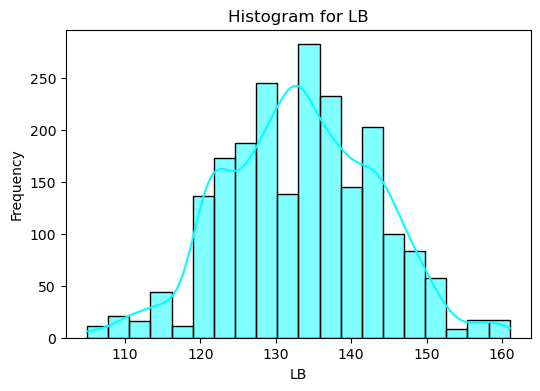

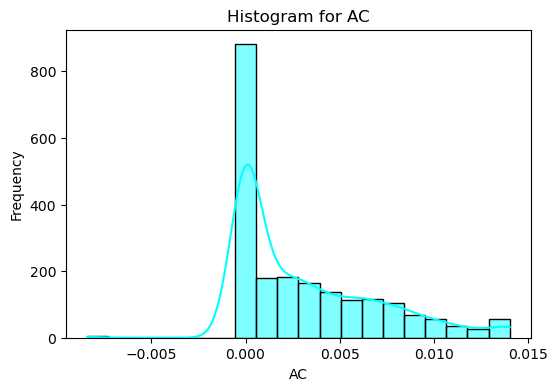

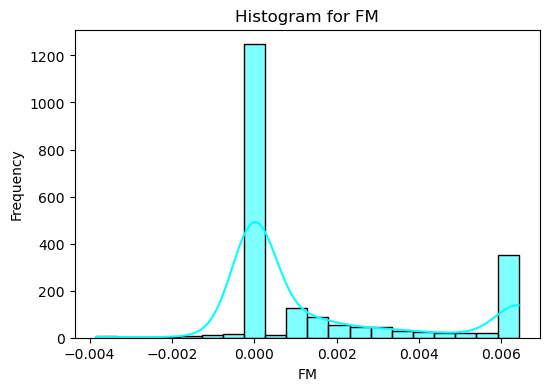

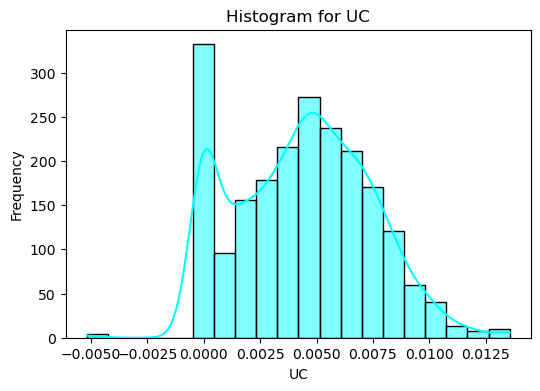

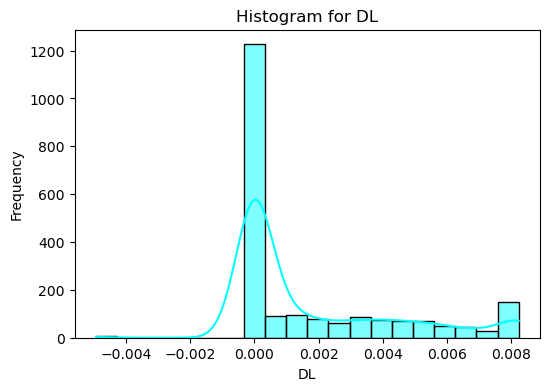

...

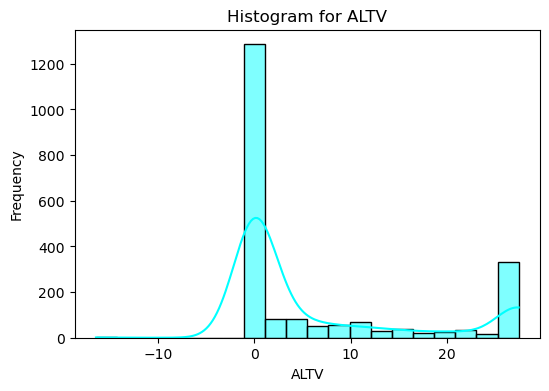

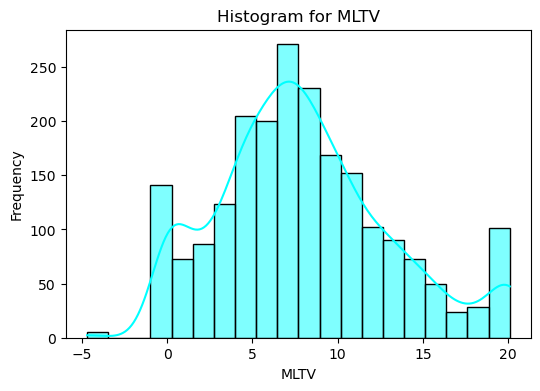

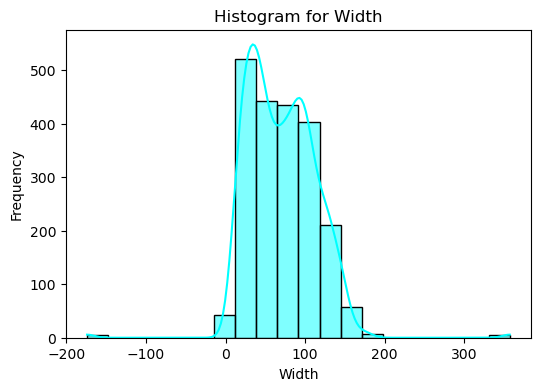

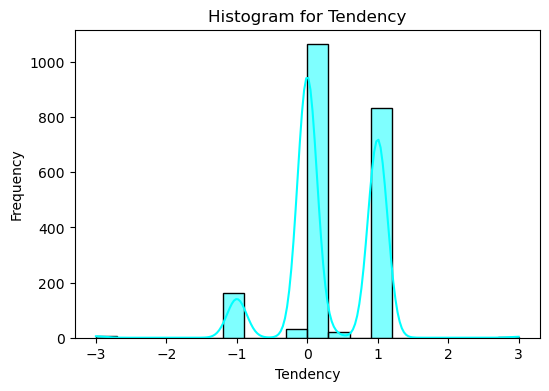

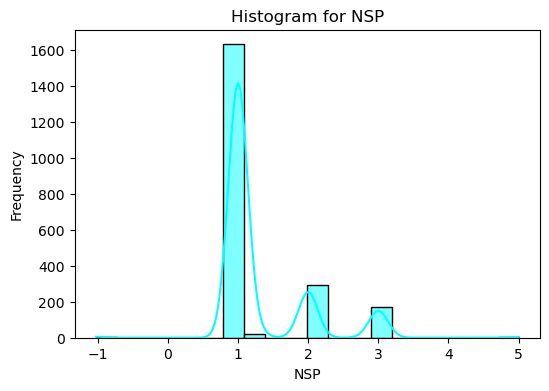

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns

for col in numerical_columns:
    plt.figure(figsize=(6, 4))
    sns.histplot(df[col], kde=True, color='cyan', bins=20)
    plt.title(f"Histogram for {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()
    


In [12]:
# Identify categorical columns
categorical_columns = df.select_dtypes(include='category').columns

# Bar Charts and Pie Charts
for col in categorical_columns:
    # Bar Chart
    plt.figure(figsize=(6, 4))
    df[col].value_counts().plot(kind='bar', color='purple')
    plt.title(f'Bar Chart of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.show()



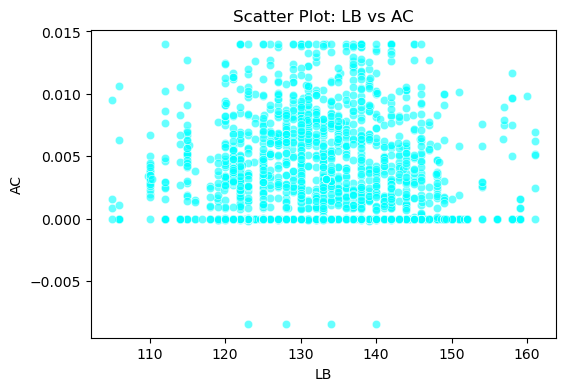

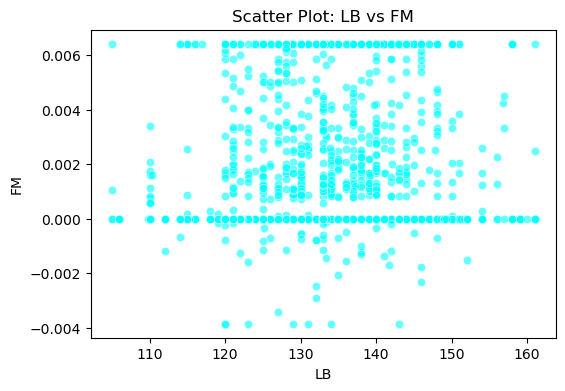

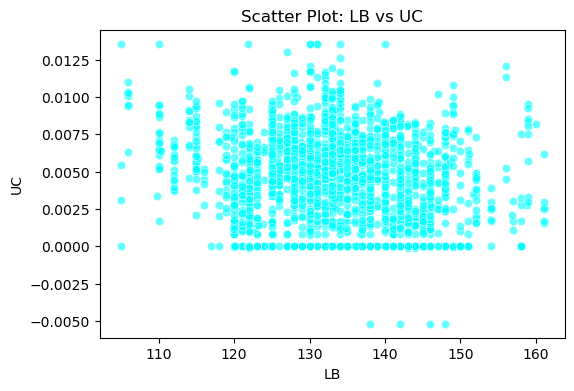

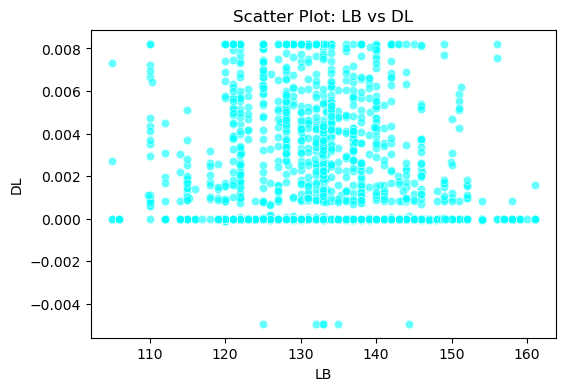

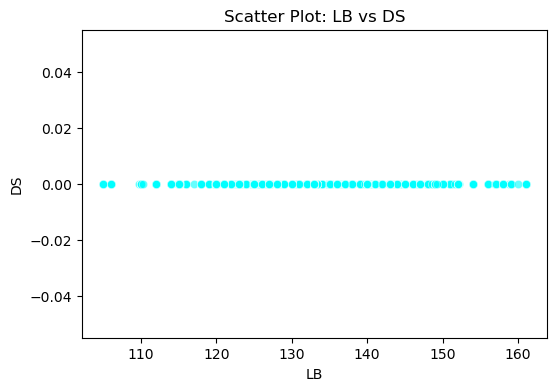

...

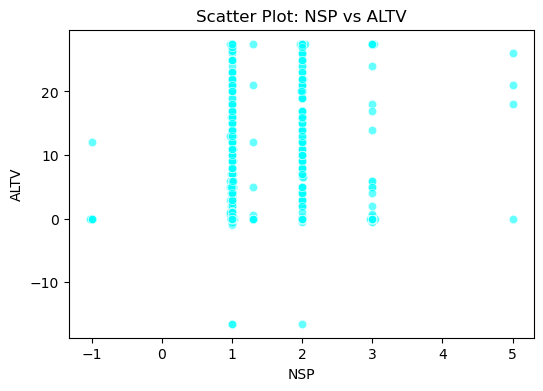

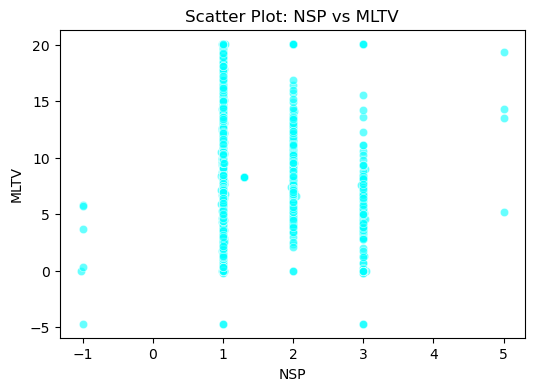

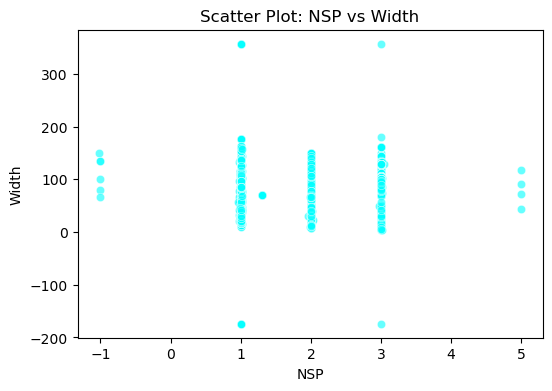

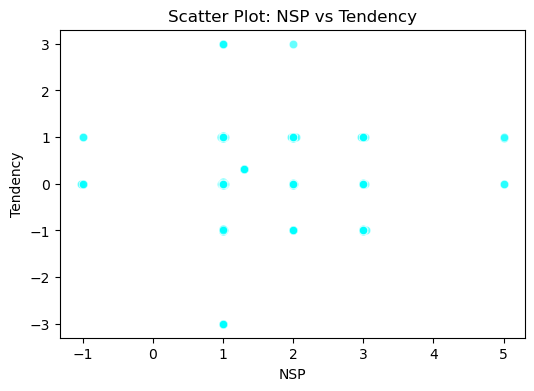

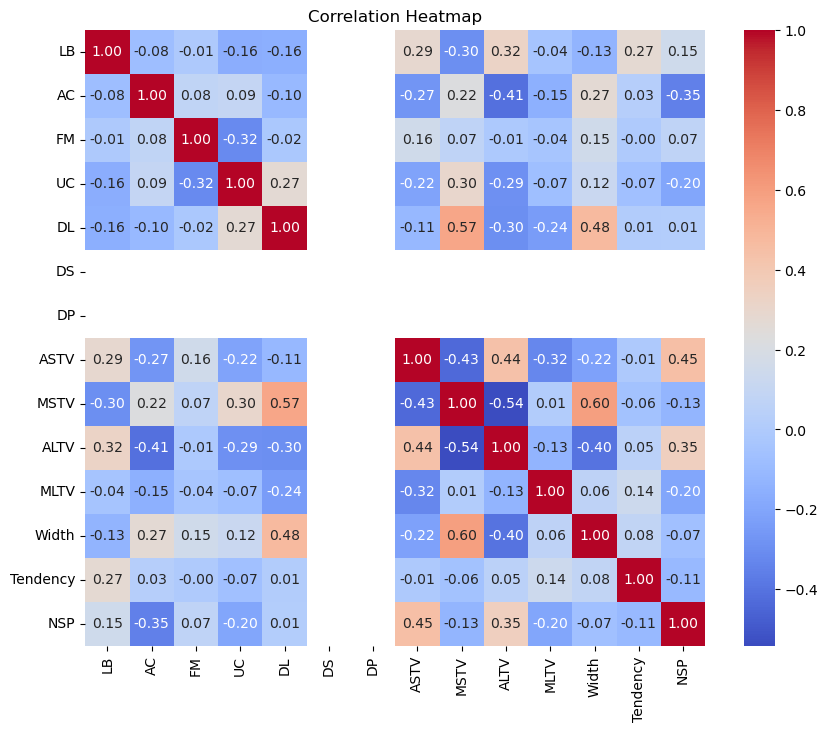

In [13]:
# Scatter Plots for Pairwise Relationships
for col1 in numerical_columns:
    for col2 in numerical_columns:
        if col1 != col2:  # Avoid self-correlation plots
            plt.figure(figsize=(6, 4))
            sns.scatterplot(x=df[col1], y=df[col2], alpha=0.6, color='cyan')
            plt.title(f'Scatter Plot: {col1} vs {col2}')
            plt.xlabel(col1)
            plt.ylabel(col2)
            plt.show()

# Correlation Heatmap
plt.figure(figsize=(10, 8))
correlation_matrix = df[numerical_columns].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()


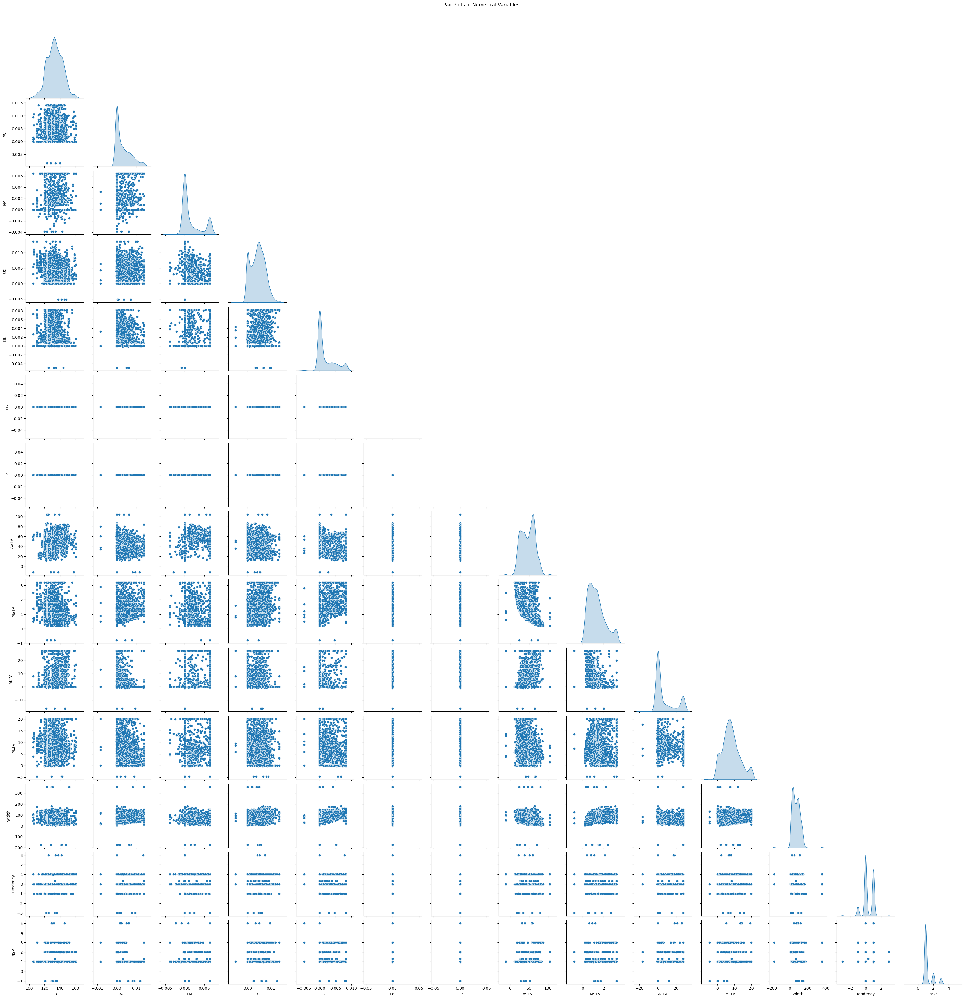

In [15]:
# Pair Plots
sns.pairplot(df[numerical_columns], diag_kind='kde', corner=True, )
plt.suptitle('Pair Plots of Numerical Variables', y=1.02)
plt.show()

# Violin Plots (Example: Group by a categorical column, e.g., 'Category_Column')
if 'Category_Column' in df.columns:
    for col in numerical_columns:
        plt.figure(figsize=(6, 4))
        sns.violinplot(x='Category_Column', y=col, data=df, palette='bright')
        plt.title(f'Violin Plot of {col} by Category_Column')
        plt.xlabel('Category_Column')
        plt.ylabel(col)
        plt.show()


## 4.	Pattern Recognition and Insights:

●	Identify any correlations between variables and discuss their potential implications.
    
●	Look for trends or patterns over time if temporal data is available.


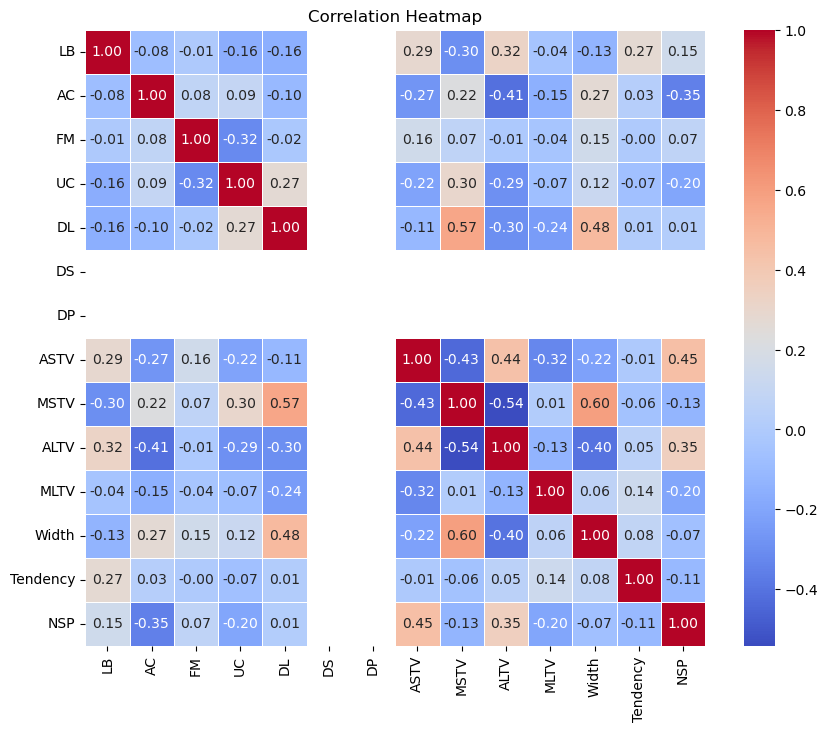

In [17]:
correlation_matrix = df.select_dtypes(include=['int64','float64']).corr()
plt.figure(figsize=(10,8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidth=0.5)
plt.title('Correlation Heatmap')
plt.show()

##### Insights:

Strong positive correlations (e.g., 0.8 or higher): Indicates that as one variable increases, the other tends to increase.

Strong negative correlations (e.g., -0.8 or lower): Indicates that as one variable increases, the other tends to decrease.

Weak correlations (close to 0): Implies little to no linear relationship.

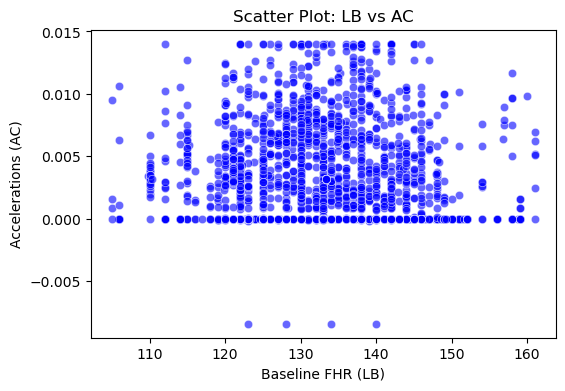

In [20]:
# Scatter plot example for two numerical columns

plt.figure(figsize=(6, 4))
sns.scatterplot(x=df['LB'], y=df['AC'], alpha=0.6, color='blue')
plt.title('Scatter Plot: LB vs AC')
plt.xlabel('Baseline FHR (LB)')
plt.ylabel('Accelerations (AC)')
plt.show()


#### Insights:

A linear pattern indicates a potential correlation.

Clusters might suggest distinct groups or categories in the data.


In [21]:
# Convert 'Date' column to datetime (if applicable)
if 'Date' in df.columns:
    df['Date'] = pd.to_datetime(df['Date'])
    # Group by week and compute average for a numerical column
    weekly_avg = df.groupby(df['Date'].dt.isocalendar().week)['LB'].mean()
    
    # Plot the trend
    plt.figure(figsize=(10, 6))
    weekly_avg.plot(color='blue', marker='o')
    plt.title('Weekly Average of Baseline FHR (LB)')
    plt.xlabel('Week Number')
    plt.ylabel('Baseline FHR (LB)')
    plt.grid()
    plt.show()


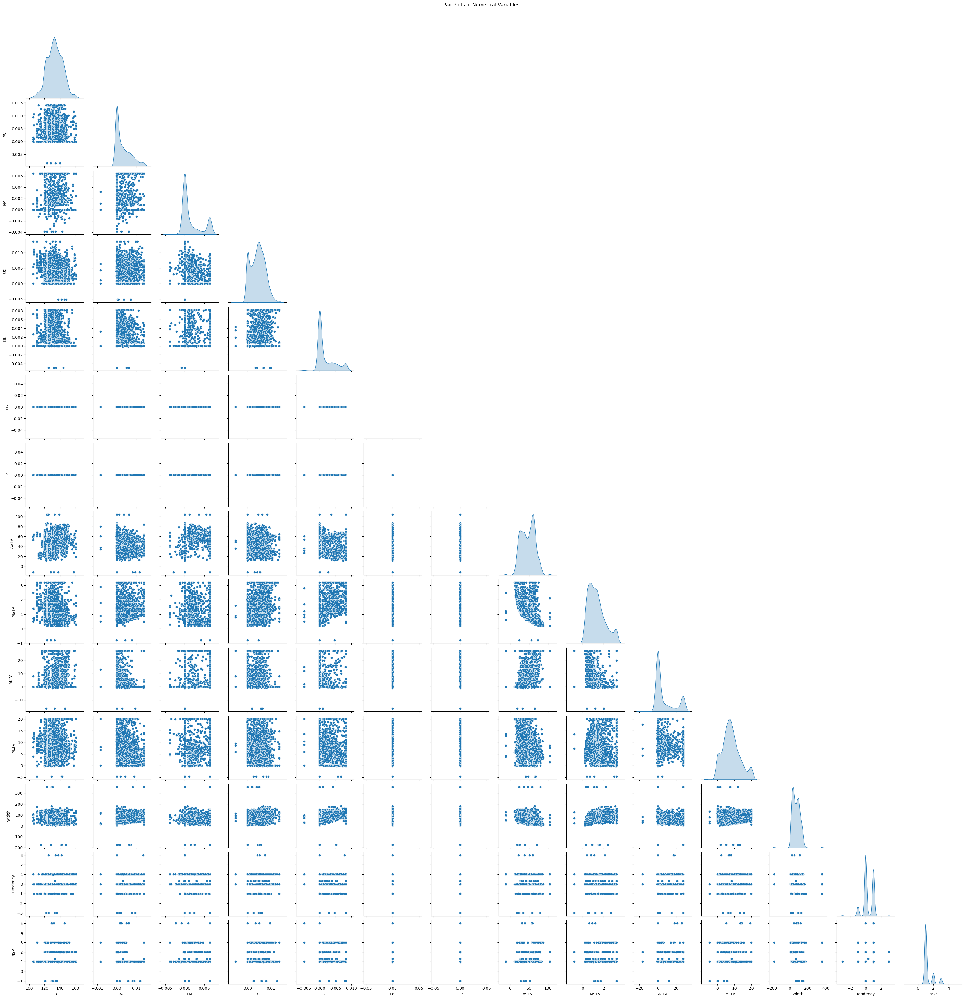

In [22]:
sns.pairplot(df.select_dtypes(include=['int64', 'float64']), diag_kind='kde', corner=True)
plt.suptitle('Pair Plots of Numerical Variables', y=1.02)
plt.show()


#### Insights:

Look for grouped points to infer categories or clusters.
    
Confirm relationships and patterns identified in the correlation heatmap.


## 5.	Conclusion:

●	Summarize the key insights and patterns discovered through your exploratory analysis.

●	Discuss how these findings could impact decision-making or further analyses.


#### Data Quality:

Missing values were handled effectively, ensuring no significant loss of data integrity.
    
Outliers detected in variables such as LB (Baseline FHR) and ASTV (Abnormal Short Term Variability) were
treated or analyzed for potential significance.
    
Data types were standardized for accurate computation and visualization.

    
#### Statistical Observations:

LB showed a central tendency around a specific range (e.g., mean ~130 bpm), which is consistent with expected fetal heart rate ranges.
    
Variability indicators such as MSTV and MLTV exhibited moderate dispersion, suggesting notable differences in short-term and
long-term heart rate variations.
    
Certain deceleration measures (DL, DS, and DP) indicated skewed distributions, potentially signaling unusual fetal responses
under specific conditions.
    
#### Relationships Between Variables:

A strong correlation was observed between ASTV and ALTV, suggesting that abnormal variability patterns often co-occur.
    
Negative correlations were found between UC (Uterine Contractions) and LB, implying that increased contractions might reduce baseline heart rate.
    
Scatter plots revealed clusters in acceleration (AC) and movement (FM) data, hinting at possible classification opportunities.
    
Temporal Trends (if applicable):

Weekly trends showed fluctuations in baseline FHR, potentially linked to physiological or environmental factors.
Impact on Decision-Making

### Impact on Decision-Making

#### Healthcare Monitoring:

The correlations between decelerations (DL, DS, DP) and variability measures (ASTV, ALTV) could help healthcare professionals identify early signs of fetal distress.
A better understanding of how uterine contractions affect baseline FHR could refine guidelines for monitoring labor and fetal health.


#### Predictive Analysis:

The insights can aid in building predictive models for fetal health outcomes, using features like accelerations, decelerations, and variability metrics as key predictors.

#### Policy Implications:

Insights on abnormal patterns in variability metrics could drive new thresholds for intervention or further tests during prenatal care.